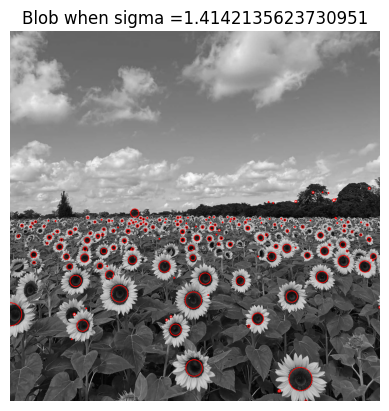

In [58]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d


# Gaussian kernel generator
def gaussian_kernel(sigma, size):
    if size % 2 == 0:
        size += 1
    idx_range = np.linspace(-(size - 1) / 2., (size - 1) / 2., size)
    x_idx, y_idx = np.meshgrid(idx_range, idx_range)
    tmp_cal = -(np.square(x_idx) + np.square(y_idx)) / (2. * sigma ** 2)
    kernel = np.exp(tmp_cal)
    kernel[kernel < np.finfo(float).eps * np.amax(kernel)] = 0
    k_sum = np.sum(kernel)
    if k_sum != 0:
        kernel /= np.sum(kernel)
    return kernel

# Laplacian of Gaussian kernel generator
def log_kernel(sigma, size):
    if size % 2 == 0:
        size += 1
    sigma2 = sigma ** 2
    idx_range = np.linspace(-(size - 1) / 2., (size - 1) / 2., size)
    x_idx, y_idx = np.meshgrid(idx_range, idx_range)
    tmp_cal = -(np.square(x_idx) + np.square(y_idx)) / (2. * sigma2)
    kernel = np.exp(tmp_cal)
    kernel[kernel < np.finfo(float).eps * np.amax(kernel)] = 0
    k_sum = np.sum(kernel)
    if k_sum != 0:
        kernel /= np.sum(kernel)
    tmp_kernel = np.multiply(kernel, np.square(x_idx) + np.square(y_idx) - 2 * sigma2) / (sigma2 ** 2)
    kernel = tmp_kernel - np.sum(tmp_kernel) / (size ** 2)
    return kernel


# Plot kernel in 3d
def show_kernel(kernel):
    size = np.shape(kernel)[0]
    idx_range = np.linspace(-(size - 1) / 2., (size - 1) / 2., size)
    x, y = np.meshgrid(idx_range, idx_range)

    fig = plt.figure(figsize=(12, 12))
    ax = fig.gca(projection='3d')
    ax.plot_surface(x, y, kernel, rstride=1, cstride=1,
                    cmap='viridis', edgecolor='none', antialiased=True)
    ax.view_init(15, 0)
    plt.show()
    plt.cla()
    plt.clf()
    plt.close(fig)


def main():
    img_name = "the_berry_farms_sunflower_field.jpeg"
    # img_name = "sunflowers"
    img = cv2.imread(img_name)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = np.float32(gray)
    cv2.normalize(gray, gray, 1, 0, cv2.NORM_MINMAX)

    sigma0 = np.sqrt(2)
    k = np.sqrt(2)
    num_scales = 15
    sigmas = sigma0 * np.power(k, np.arange(num_scales))
    # apply LoG kernel filtering with scaled kernel size and sigma
    img_stack = None
    for i in range(num_scales):
        size = int(2 * np.ceil(4 * sigmas[i]) + 1)
        # with Laplacian response normalization
        kernel = log_kernel(sigmas[i], size) * np.power(sigmas[i], 2)
        filtered = cv2.filter2D(gray, cv2.CV_32F, kernel)
        filtered = pow(filtered, 2)
        if i == 0:
            img_stack = filtered
        else:
            img_stack = np.dstack((img_stack, filtered))

    # Maximum response extraction
    scale_space = None
    for i in range(num_scales):
        filtered = cv2.dilate(img_stack[:, :, i], np.ones((3, 3)), cv2.CV_32F, (-1, -1), 1, cv2.BORDER_CONSTANT)
        if i == 0:
            scale_space = filtered
        else:
            scale_space = np.dstack((scale_space, filtered))
    max_stack = np.amax(scale_space, axis=2)
    max_stack = np.repeat(max_stack[:, :, np.newaxis], num_scales, axis=2)
    max_stack = np.multiply((max_stack == scale_space), scale_space)

    radius_vec = None
    x_vec = None
    y_vec = None
    for i in range(num_scales):
        radius = np.sqrt(2) * sigmas[i]
        threshold = 0.1
        # filter out redundant response
        valid = (max_stack[:, :, i] == img_stack[:, :, i]) * img_stack[:, :, i]
        valid[valid <= threshold] = 0
        (x, y) = np.nonzero(valid)
        if i == 1:
            x_vec = x
            y_vec = y
            radius_vec = np.repeat(radius, np.size(x))
        else:
            x_vec = np.concatenate((x_vec, x), axis=None)
            y_vec = np.concatenate((y_vec, y), axis=None)
            tmp_vec = np.repeat(radius, np.size(x))
            radius_vec = np.concatenate((radius_vec, tmp_vec), axis=None)

    out = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    out = cv2.cvtColor(out, cv2.COLOR_GRAY2BGR)
    for i in range(np.size(x_vec)):
        cv2.circle(out,(y_vec[i], x_vec[i]), int(radius_vec[i]), (0, 0, 255), 2)
    #cv2.imshow("Blob Num "+str(np.size(x_vec)), out)

    plt.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))
    plt.title("Blob when sigma =" + str(sigma0))
    plt.axis('off')
    plt.show()

main()

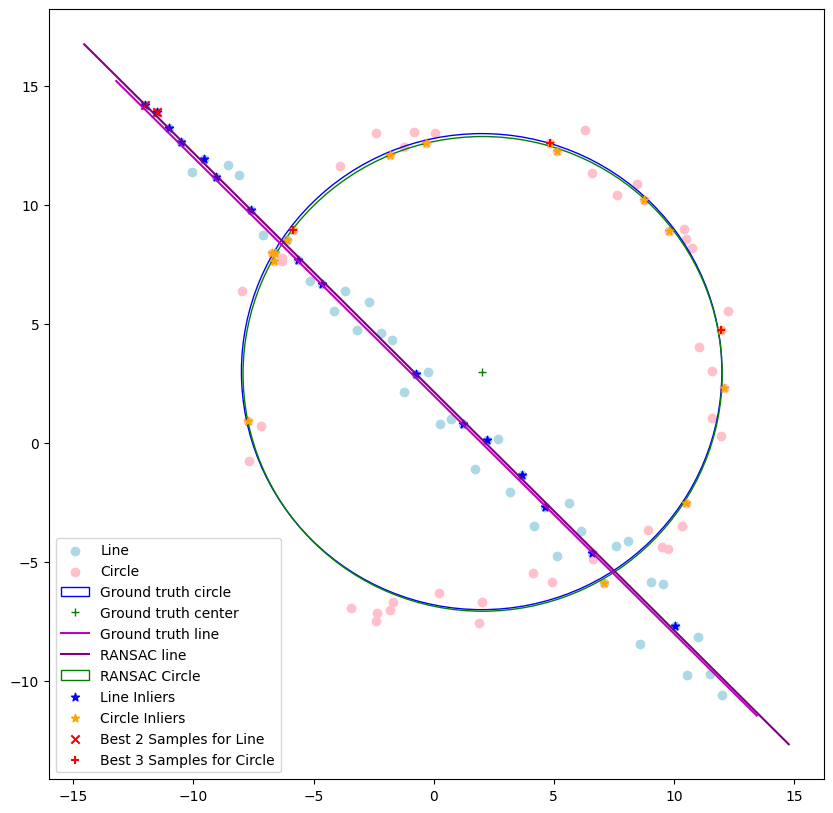

In [42]:
import numpy as np
import matplotlib.pyplot as plt
import math
from scipy.optimize import minimize

import numpy as np
import matplotlib.pyplot as plt

# Seed for reproducibility
np.random.seed(1)

N = 100
half_n = N // 2
r = 10
x0_gt, y0_gt = 2, 3  # Center of the circle
s = r / 16

# Generate points for the circle
theta = np.random.uniform(0, 2 * np.pi, half_n)
noise = s * np.random.randn(half_n)
x_circle = x0_gt + (r + noise) * np.cos(theta)
y_circle = y0_gt + (r + noise) * np.sin(theta)

X_circ = np.column_stack((x_circle, y_circle))

# Generate points for the line
s = 1.0
m, b = -1, 2

x_line = np.linspace(-12, 12, half_n)
y_line = m * x_line + b + s * np.random.randn(half_n)

X_line = np.column_stack((x_line, y_line))

# Concatenate points from both circle and line to create X
X = np.vstack((X_circ, X_line))

# Plot the noisy points, ground truth line, and ground truth circle
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.scatter(X_line[:, 0], X_line[:, 1], color = 'lightblue', label='Line')
ax.scatter(X_circ[:, 0], X_circ[:, 1], color = 'pink', label='Circle')
circle_gt = plt.Circle((x0_gt, y0_gt), r, color='blue', fill=False, label='Ground truth circle')
ax.add_artist(circle_gt)
ax.plot(x0_gt, y0_gt, '+g', label='Ground truth center')
x_min, x_max = ax.get_xlim()
x_range = np.array([x_min, x_max])
y_range = m * x_range + b
plt.plot(x_range, y_range, color='m', label='Ground truth line')


# Define a function to calculate the line equation from two points
def line_equation_from_points(x1, y1, x2, y2):
    delta_x = x2 - x1
    delta_y = y2 - y1
    magnitude = math.sqrt(delta_x**2 + delta_y**2)
    a = delta_y / magnitude
    b = -delta_x / magnitude
    d = (a * x1) + (b * y1)
    return a, b, d

# RANSAC to fit a line with unit normal constraint
def ransac_line(X, iterations, threshold, min_inliers):
    best_model = None
    best_inliers = []
    
    for _ in range(iterations):
        sample_indices = np.random.choice(len(X), 2, replace=False)
        x1, y1 = X[sample_indices[0]]
        x2, y2 = X[sample_indices[1]]
        
        a, b, d = line_equation_from_points(x1, y1, x2, y2)
        
        # Constraint: Ensure unit normal vector
        magnitude = np.sqrt(a**2 + b**2)
        a /= magnitude
        b /= magnitude
        
        # Calculate the distance of all points to the line
        distances = np.abs(a*X[:,0] + b*X[:,1] - d)
        
        # Find inliers based on the threshold
        inliers = np.where(distances < threshold)[0]
        
        if len(inliers) >= min_inliers:
            if len(inliers) > len(best_inliers):
                best_model = (a, b, d)
                best_inliers = inliers
                
    return best_model, best_inliers

# RANSAC parameters
iterations = 10000
threshold = 0.15
min_inliers = 15

# Estimate the line using RANSAC
best_line_model, Line_inlier_indices = ransac_line(X_line, iterations, threshold, min_inliers)

# Define a function to calculate the circle equation from three points
def circle_equation_from_points(x1, y1, x2, y2, x3, y3):
    # Calculate the midpoints of two line segments
    mx1, my1 = (x1 + x2) / 2, (y1 + y2) / 2
    mx2, my2 = (x2 + x3) / 2, (y2 + y3) / 2
    # Calculate the slopes of the two lines
    if y2 - y1 == 0:
        slope1 = 0  # Avoid division by zero
    else:
        slope1 = (x2 - x1) / (y2 - y1)
    
    if y3 - y2 == 0:
        slope2 = 0  # Avoid division by zero
    else:
        slope2 = (x3 - x2) / (y3 - y2)
    
    # Calculate the center of the circle
    x_center = (slope1 * mx1 - slope2 * mx2 + my2 - my1) / (slope1 - slope2)
    y_center = -slope1 * (x_center - mx1) + my1
    
    # Calculate the radius
    radius = np.sqrt((x1 - x_center)**2 + (y1 - y_center)**2)
    
    return x_center, y_center, radius

# RANSAC to fit a circle
def ransac_circle(X, iterations, threshold, min_inliers):
    best_model = None
    best_inliers = []    
    for _ in range(iterations):
        sample_indices = np.random.choice(len(X), 3, replace=False)
        x1, y1 = X[sample_indices[0]]
        x2, y2 = X[sample_indices[1]]
        x3, y3 = X[sample_indices[2]]        
        x_center, y_center, radius = circle_equation_from_points(x1, y1, x2, y2, x3, y3)        
        # Calculate the radial error of all points to the circle
        errors = np.abs(np.sqrt((X[:, 0] - x_center)**2 + (X[:, 1] - y_center)**2) - radius)        
        # Find inliers based on the threshold
        inliers = np.where(errors < threshold)[0]        
        if len(inliers) >= min_inliers:
            if len(inliers) > len(best_inliers):
                best_model = (x_center, y_center, radius)
                best_inliers = inliers                
    return best_model, best_inliers

# RANSAC parameters for circle estimation
circle_iterations = 10000
circle_threshold = 0.2  # Adjust the threshold as needed
circle_min_inliers = 15

# Identify the remnant points (not explained by the line)
remnant_indices = [i for i in range(len(X)) if i not in Line_inlier_indices]
remnant_points = X[remnant_indices]
# Estimate the circle using RANSAC
best_circle_model, circle_inlier_indices = ransac_circle(remnant_points, circle_iterations, circle_threshold, circle_min_inliers)


# Plot the results

# Plot the estimated line
x_min, x_max = ax.get_xlim()
x_range = np.array([x_min, x_max])
y_range = (-best_line_model[0] * x_range + best_line_model[2]) / best_line_model[1]
plt.plot(x_range, y_range, label='RANSAC line', color='purple')
# Plot the estimated circle
x_center, y_center, radius = best_circle_model
circle_estimated = plt.Circle((x_center, y_center), radius, color='g', fill=False, label='RANSAC Circle')
ax.add_artist(circle_estimated)

ax.scatter(X_line[Line_inlier_indices, 0], X_line[Line_inlier_indices, 1], color='blue',marker='*', label='Line Inliers')


# Find the best 2 samples for the line
best_line_sample_indices = Line_inlier_indices[:2]
best_line_samples = X_line[best_line_sample_indices]


# Plot the inliers of the circle
ax.scatter(remnant_points[circle_inlier_indices, 0], remnant_points[circle_inlier_indices, 1], color='orange',marker='*' ,label='Circle Inliers')



# Find the best 3 samples for the circle (using circle_inlier_indices)
best_circle_sample_indices = circle_inlier_indices[:3]
best_circle_samples = remnant_points[best_circle_sample_indices]


# Plot the best 2 samples for the line and the best 3 samples for the circle
ax.scatter(best_line_samples[:, 0], best_line_samples[:, 1], color='red', marker='x', label='Best 2 Samples for Line')
ax.scatter(best_circle_samples[:, 0], best_circle_samples[:, 1], color='red', marker='+', label='Best 3 Samples for Circle')


plt.legend()
plt.show()
    

In [11]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import random


[[ 4.10425098e+00  3.26614262e-01 -2.46661806e+03]
 [-5.15868447e-01  2.75216871e+00 -4.39422938e+02]
 [-4.59396823e-04 -6.12023881e-04  1.00000000e+00]]


Text(0.5, 1.0, 'Image Warpped')

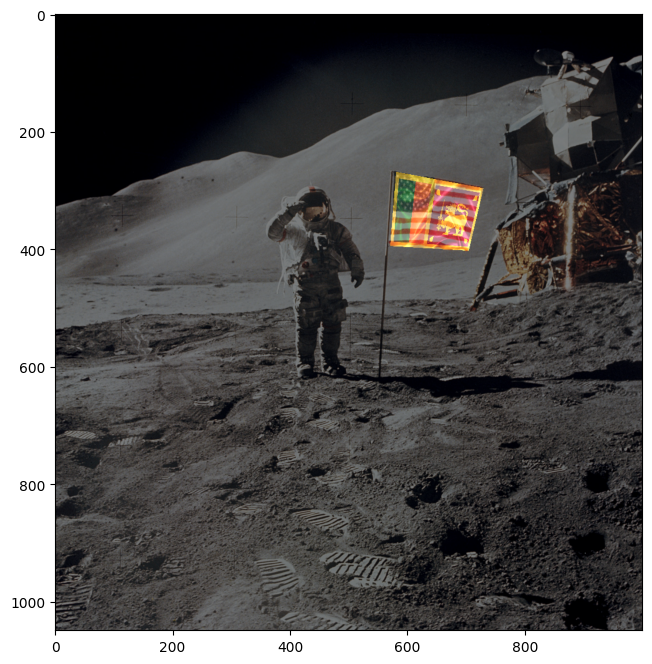

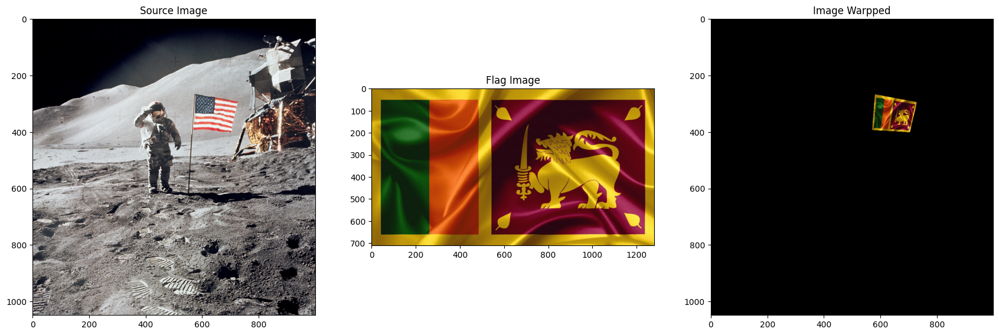

In [94]:
N = 4 # Number of points
global n
n = 0

# Parameters of the two images
p = np.empty((N,2))
p_flag = np.empty((N,2))

# Mouse callback function
def draw_circle(event,x,y,flags,param):
    global n
    p = param[0]
    if event == cv.EVENT_LBUTTONDOWN:
        cv.circle(param[1],(x,y),5,(255,0,0),-1)
        p[n] = (x,y)
        n += 1

# Importing the images and creating copies
im = cv.imread('moon.jpg', cv.IMREAD_COLOR)
im_flag = cv.imread('flag.webp', cv.IMREAD_COLOR)
im_copy = im.copy()
im_flag_copy = im_flag.copy()
cv.namedWindow('Image', cv.WINDOW_AUTOSIZE)
param = [p, im_copy]
cv.setMouseCallback('Image',draw_circle, param)
while(1):
    cv.imshow('Image', im_copy)
    if n == N:
        break
    if cv.waitKey(20) & 0xFF == 27:
        break

# Getting the mouse points of the flag
n = 0
cv.namedWindow('Image Flag', cv.WINDOW_AUTOSIZE)
param = [p_flag, im_flag_copy]
cv.setMouseCallback('Image Flag',draw_circle, param)
while(1):
    cv.imshow('Image Flag', im_flag_copy)
    if n == N:
        break
    if cv.waitKey(20) & 0xFF == 27:
        break
cv.destroyAllWindows()

h, status = cv.findHomography(p, p_flag) 
print(h)
warped_img = cv.warpPerspective(im_flag, np.linalg.inv(h), (im.shape[1],im.shape[0])) 
# Blending
alpha = 0.5
beta = 0.8
blended = cv.addWeighted(im, alpha, warped_img, beta, 0.0)
fig, ax = plt.subplots(1,1,figsize= (8,8))
ax.imshow(cv.cvtColor(blended,cv.COLOR_BGR2RGB))


fig,ax=plt.subplots(1,3,figsize=(21,7))
ax[0].imshow(cv.cvtColor(im,cv.COLOR_BGR2RGB))
ax[0].set_title("Source Image")
ax[1].imshow(cv.cvtColor(im_flag,cv.COLOR_BGR2RGB))
ax[1].set_title("Flag Image")
ax[2].imshow(cv.cvtColor(warped_img,cv.COLOR_BGR2RGB))
ax[2].set_title("Image Warpped")

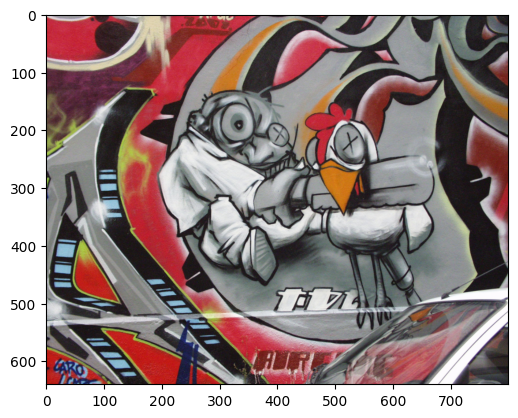

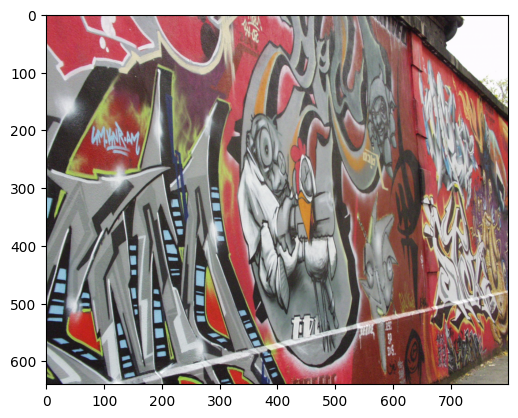

In [67]:
# Import images
img1 = cv.imread('graf/img1.ppm')  
img2 = cv.imread('graf/img2.ppm')  
img3 = cv.imread('graf/img3.ppm')  
img4 = cv.imread('graf/img4.ppm')  
img5 = cv.imread('graf/img5.ppm')


plt.imshow(cv.cvtColor(img1,cv.COLOR_BGR2RGB))
plt.show()
plt.imshow(cv.cvtColor(img5,cv.COLOR_BGR2RGB))
plt.show()

In [68]:
def sift_match(im1, im2):

    GOOD_MATCH_PERCENT = 0.65

    # Detect sift features
    sift = cv.SIFT_create()
    keypoint_1, descriptors_1 = sift.detectAndCompute(im1,None)
    keypoint_2, descriptors_2 = sift.detectAndCompute(im2,None)

    # Match features.
    matcher = cv.BFMatcher()
    matches = matcher.knnMatch(descriptors_1, descriptors_2, k = 2) 

    # Filter good matches using ratio test in Lowe's paper
    good_matches = []

    for a,b in matches:
        if a.distance < GOOD_MATCH_PERCENT*b.distance:
            good_matches.append(a)

    # Extract location of good matches
    points1 = np.zeros((len(good_matches), 2), dtype=np.float32)
    points2 = np.zeros((len(good_matches), 2), dtype=np.float32)

    for i, match in enumerate(good_matches):
        points1[i, :] = keypoint_1[match.queryIdx].pt
        points2[i, :] = keypoint_2[match.trainIdx].pt

    # Plot the matching
    fig, ax = plt.subplots(figsize = (15,15))
    ax.axis('off')
    matched_img = cv.drawMatches(im1, keypoint_1, im2, keypoint_2, good_matches, im2, flags = 2)
    plt.imshow(cv.cvtColor(matched_img,cv.COLOR_BGR2RGB))
    plt.show()

    result = np.concatenate((points1,points2), axis = 1)

    return result

In [69]:
def random_sample(data_list):
    """
    Returns a list of 3 random samples from a given list
    """
    sample_list = []
    random.seed(0)
    rand_nums = random.sample(range(1, len(data_list)), 3)
    for i in rand_nums:
        sample_list.append(data_list[i])
    return np.array(sample_list)

In [70]:
def calculateHomography(correspondences):
    temp_list = []
    for points in correspondences:
        p1 = np.matrix([points.item(0), points.item(1), 1]) # (x1,y1)
        p2 = np.matrix([points.item(2), points.item(3), 1]) # (x2,y2)

        a2 = [0, 0, 0, -p2.item(2) * p1.item(0), -p2.item(2) * p1.item(1), -p2.item(2) * p1.item(2),
              p2.item(1) * p1.item(0), p2.item(1) * p1.item(1), p2.item(1) * p1.item(2)]
        a1 = [-p2.item(2) * p1.item(0), -p2.item(2) * p1.item(1), -p2.item(2) * p1.item(2), 0, 0, 0,
              p2.item(0) * p1.item(0), p2.item(0) * p1.item(1), p2.item(0) * p1.item(2)]
        temp_list.append(a1)
        temp_list.append(a2)

    assemble_matrix = np.matrix(temp_list)

    #svd composition
    u, s, v = np.linalg.svd(assemble_matrix)

    #reshape the min singular value into a 3 by 3 matrix
    h = np.reshape(v[8], (3, 3))

    #normalize 
    h = (1/h.item(8)) * h
    return h

In [71]:
def loss(matched_points, h):
    point1 = np.transpose(np.matrix([matched_points[0].item(0), matched_points[0].item(1), 1]))
    point2 = np.transpose(np.matrix([matched_points[0].item(2), matched_points[0].item(3), 1]))
    
    # Estimate the point after applying the homography
    transformed_point2 = np.dot(h, point1)
    transformed_point2 = (1/transformed_point2.item(2))*transformed_point2

    # Calculate the error between the actual and estimated point
    error = point2 - transformed_point2
    
    return np.linalg.norm(error)

def ransac(matched_points):
    maxInliers = 0
    best_H = None
    for i in range(10):
        random_points = random_sample(matched_points)

        # Generate the homography 
        homography = calculateHomography(random_points)
        num_inliers = 0

        # Find the inliers
        for i in range(len(matched_points)):
            d = loss(matched_points[i], homography)
            if d < 3:
                num_inliers += 1

        if num_inliers > maxInliers:
            maxInliers = num_inliers
            best_H = homography
    
    return best_H

In [72]:
def homography_reshape(homography):
    homography_ = np.array(homography)
    homography_ = homography_.reshape(3,3)
    homography_ = homography_/(homography_[-1][-1])
    return homography_

In [73]:
def plot_warped(im1, im2, h):
    width = im1.shape[1] + im2.shape[1]
    height = im1.shape[0] + im2.shape[0]
    result = cv.warpPerspective(im1, h, (width, height))
    result[0:im2.shape[0], 0:im2.shape[1]] = im2
    fig, ax = plt.subplots(1,1,figsize= (8,8))
    ax.imshow(cv.cvtColor(result,cv.COLOR_BGR2RGB))

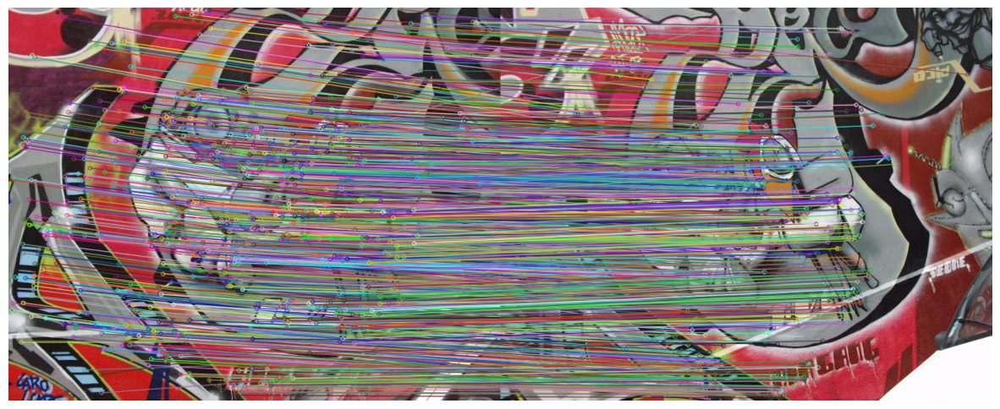

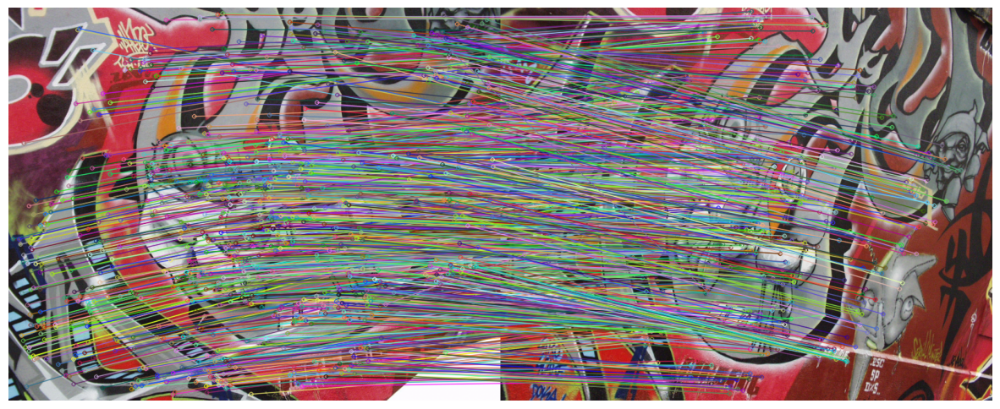

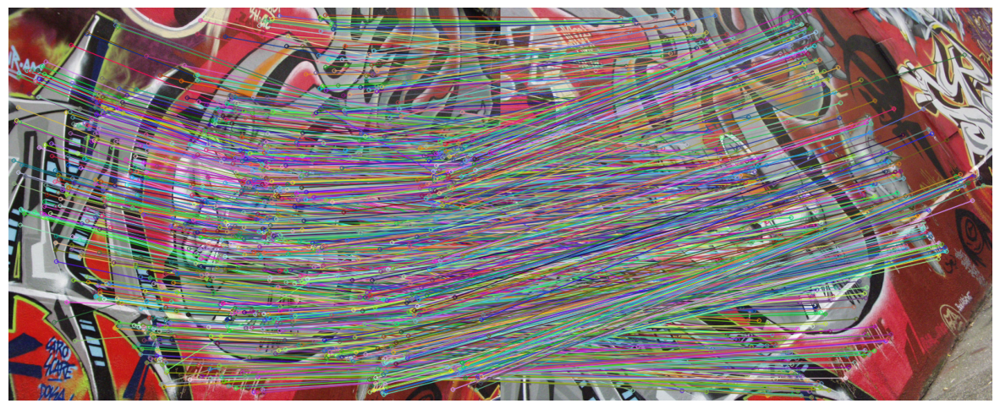

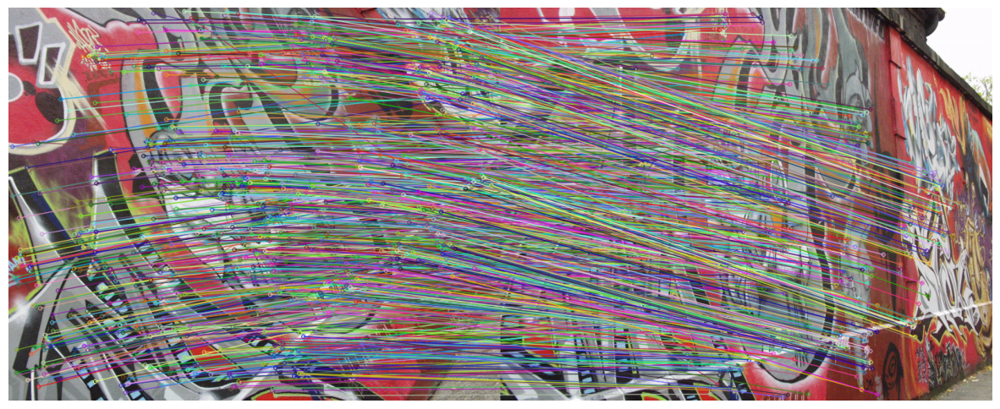

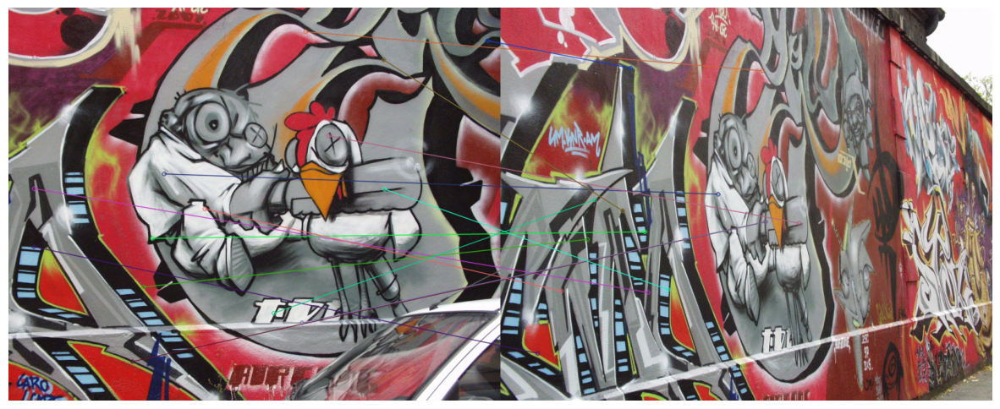

[[ 6.70443673e+00 -7.22470754e+00 -1.39447473e+00]
 [ 5.29689825e+00 -5.17070305e+00 -2.37703088e+02]
 [ 1.02250666e-02 -1.32862858e-02  1.00000000e+00]]


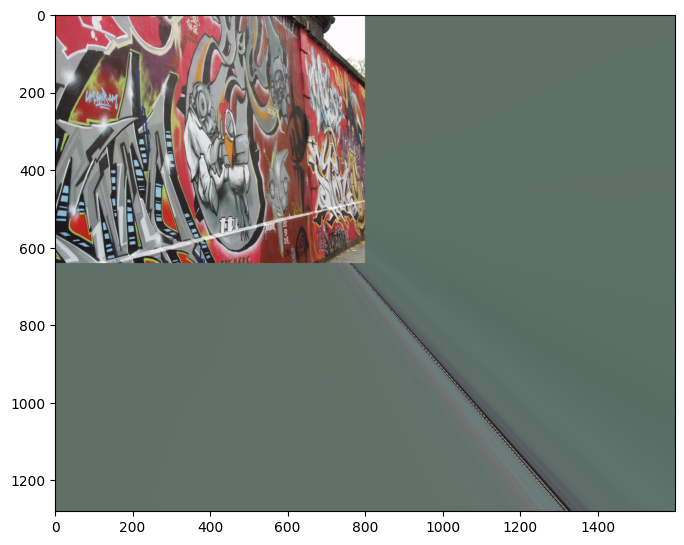

In [74]:
match1_2 = sift_match(img1,img2)
match2_3 = sift_match(img2,img3)
match3_4 = sift_match(img3,img4)
match4_5 = sift_match(img4,img5)
match1_5 = sift_match(img1,img5)

# Generate Correspondence Matrices
correspondenceMatrix1_2 = np.matrix(match1_2)
correspondenceMatrix2_3 = np.matrix(match2_3)
correspondenceMatrix3_4 = np.matrix(match3_4)
correspondenceMatrix4_5 = np.matrix(match4_5)

# Run ransac algorithm
H1_2 = ransac(correspondenceMatrix1_2)
H2_3 = ransac(correspondenceMatrix2_3)
H3_4 = ransac(correspondenceMatrix3_4)
H4_5 = ransac(correspondenceMatrix4_5)

# Reshaping the homography to the matric format
H1_2 = homography_reshape(H1_2)
H2_3 = homography_reshape(H2_3)
H3_4 = homography_reshape(H3_4)
H4_5 = homography_reshape(H4_5)

H1_5 = H4_5@H3_4@H2_3@H1_2
H1_5 = homography_reshape(H1_5)
print(H1_5)

plot_warped(img1,img5,H1_5)